<center>
    <img src="https://gitlab.com/ibm/skills-network/courses/placeholder101/-/raw/master/labs/module%201/images/IDSNlogo.png" width="300" alt="cognitiveclass.ai logo"  />
</center>


# **Space X  Falcon 9 First Stage Landing Prediction**


## Assignment:  Machine Learning Prediction


Estimated time needed: **60** minutes


Space X advertises Falcon 9 rocket launches on its website with a cost of 62 million dollars; other providers cost upward of 165 million dollars each, much of the savings is because Space X can reuse the first stage. Therefore if we can determine if the first stage will land, we can determine the cost of a launch. This information can be used if an alternate company wants to bid against space X for a rocket launch.   In this lab, you will create a machine learning pipeline  to predict if the first stage will land given the data from the preceding labs.


![](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/Images/landing\_1.gif)


Several examples of an unsuccessful landing are shown here:


![](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/Images/crash.gif)


Most unsuccessful landings are planed. Space X; performs a controlled landing in the oceans.


## Objectives


Perform exploratory  Data Analysis and determine Training Labels

*   create a column for the class
*   Standardize the data
*   Split into training data and test data

\-Find best Hyperparameter for SVM, Classification Trees and Logistic Regression

*   Find the method performs best using test data


***


## Import Libraries and Define Auxiliary Functions


We will import the following libraries for the lab


In [38]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
import seaborn as sns
# Preprocessing allows us to standarsize our data
from sklearn import preprocessing
# Allows us to split our data into training and testing data
from sklearn.model_selection import train_test_split
# Allows us to test parameters of classification algorithms and find the best one
from sklearn.model_selection import GridSearchCV
# Logistic Regression classification algorithm
from sklearn.linear_model import LogisticRegression
# Support Vector Machine classification algorithm
from sklearn.svm import SVC

from sklearn.ensemble import RandomForestClassifier
# Decision Tree classification algorithm
from sklearn.tree import DecisionTreeClassifier
# K Nearest Neighbors classification algorithm
from sklearn.neighbors import KNeighborsClassifier

This function is to plot the confusion matrix.


In [2]:
def plot_confusion_matrix(y,y_predict):
    "this function plots the confusion matrix"
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y, y_predict)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['did not land', 'land']); ax.yaxis.set_ticklabels(['did not land', 'landed'])

## Load the dataframe


Load the data


In [3]:
data = pd.read_csv("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/dataset_part_2.csv")

# If you were unable to complete the previous lab correctly you can uncomment and load this csv

# data = pd.read_csv('https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/dataset_part_2.csv')

data.head()

,FlightNumber,Date,BoosterVersion,PayloadMass,Orbit,LaunchSite,Outcome,Flights,GridFins,Reused,Legs,LandingPad,Block,ReusedCount,Serial,Longitude,Latitude,Class
0,1,2010-06-04,Falcon 9,6104.959412,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0003,-80.577366,28.561857,0
1,2,2012-05-22,Falcon 9,525.000000,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0005,-80.577366,28.561857,0
2,3,2013-03-01,Falcon 9,677.000000,ISS,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0007,-80.577366,28.561857,0
3,4,2013-09-29,Falcon 9,500.000000,PO,VAFB SLC 4E,False Ocean,1,False,False,False,NaN,1.0,0,B1003,-120.610829,34.632093,0
4,5,2013-12-03,Falcon 9,3170.000000,GTO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1004,-80.577366,28.561857,0


In [4]:
X = pd.read_csv('https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/dataset_part_3.csv')

# If you were unable to complete the previous lab correctly you can uncomment and load this csv

# X = pd.read_csv('https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/dataset_part_3.csv')

X.head(100)

,FlightNumber,PayloadMass,Flights,Block,ReusedCount,Orbit_ES-L1,Orbit_GEO,Orbit_GTO,Orbit_HEO,Orbit_ISS,...,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062,GridFins_False,GridFins_True,Reused_False,Reused_True,Legs_False,Legs_True
0,1.0,6104.959412,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,2.0,525.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
2,3.0,677.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.0,500.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,5.0,3170.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,86.0,15400.000000,2.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
86,87.0,15400.000000,3.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
87,88.0,15400.000000,6.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
88,89.0,15400.000000,3.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0


## TASK  1


Create a NumPy array from the column <code>Class</code> in <code>data</code>, by applying the method <code>to_numpy()</code>  then
assign it  to the variable <code>Y</code>,make sure the output is a  Pandas series (only one bracket df\['name of  column']).


In [5]:
Y = data['Class'].to_numpy()

## TASK  2


Standardize the data in <code>X</code> then reassign it to the variable  <code>X</code> using the transform provided below.


In [6]:
# students get this 
transform = preprocessing.StandardScaler()

In [7]:
X = transform.fit(X).transform(X.astype(float))

We split the data into training and testing data using the  function  <code>train_test_split</code>.   The training data is divided into validation data, a second set used for training  data; then the models are trained and hyperparameters are selected using the function <code>GridSearchCV</code>.


## TASK  3


Use the function train_test_split to split the data X and Y into training and test data. Set the parameter test_size to  0.2 and random_state to 2. The training data and test data should be assigned to the following labels.


<code>X_train, X_test, Y_train, Y_test</code>


In [8]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

we can see we only have 18 test samples.


In [9]:
Y_test.shape

(18,)

## TASK  4


Create a logistic regression object  then create a  GridSearchCV object  <code>logreg_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [10]:
parameters ={'C':[0.01,0.1,1],
             'penalty':['l2'],
             'solver':['lbfgs']}

In [11]:
parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
lr=LogisticRegression()
logreg_cv = GridSearchCV(lr, parameters, cv=10)
logreg_cv.fit(X_train, Y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l2'],
                         'solver': ['lbfgs']})

We output the <code>GridSearchCV</code> object for logistic regression. We display the best parameters using the data attribute <code>best_params\_</code> and the accuracy on the validation data using the data attribute <code>best_score\_</code>.


In [12]:
print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
accuracy : 0.8464285714285713


## TASK  5


Calculate the accuracy on the test data using the method <code>score</code>:


In [13]:
logreg_cv.score(X_test, Y_test)

0.8333333333333334

Lets look at the confusion matrix:


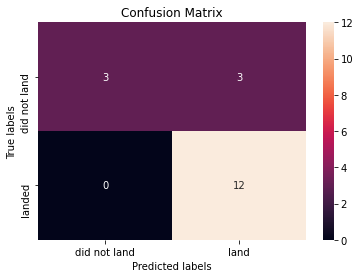

In [14]:
yhat=logreg_cv.predict(X_test)
plot_confusion_matrix(Y_test,yhat)

In [15]:
from sklearn.metrics import classification_report

print(classification_report(Y_test, yhat))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67         6
           1       0.80      1.00      0.89        12

    accuracy                           0.83        18
   macro avg       0.90      0.75      0.78        18
weighted avg       0.87      0.83      0.81        18



Examining the confusion matrix, we see that logistic regression can distinguish between the different classes.  We see that the major problem is false positives.


## TASK  6


Create a support vector machine object then  create a  <code>GridSearchCV</code> object  <code>svm_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [16]:
parameters = {'kernel':('linear', 'rbf','poly','rbf', 'sigmoid'),
              'C': np.logspace(-3, 3, 5),
              'gamma':np.logspace(-3, 3, 5)}
svm = SVC()

In [17]:
svm_cv = GridSearchCV(svm, parameters, cv=10)
svm_cv.fit(X_train, Y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': array([1.00000000e-03, 3.16227766e-02, 1.00000000e+00, 3.16227766e+01,
       1.00000000e+03]),
                         'gamma': array([1.00000000e-03, 3.16227766e-02, 1.00000000e+00, 3.16227766e+01,
       1.00000000e+03]),
                         'kernel': ('linear', 'rbf', 'poly', 'rbf', 'sigmoid')})

In [18]:
print("tuned hpyerparameters :(best parameters) ",svm_cv.best_params_)
print("accuracy :",svm_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'gamma': 0.03162277660168379, 'kernel': 'sigmoid'}
accuracy : 0.8482142857142856


## TASK  7


Calculate the accuracy on the test data using the method <code>score</code>:


In [19]:
svm_cv.score(X_test, Y_test)

0.8333333333333334

We can plot the confusion matrix


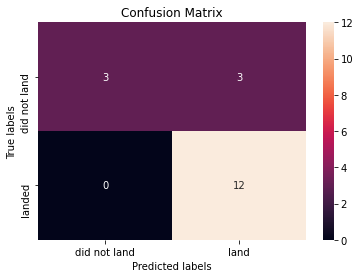

In [20]:
yhat=svm_cv.predict(X_test)
plot_confusion_matrix(Y_test,yhat)

## TASK  8


Create a decision tree classifier object then  create a  <code>GridSearchCV</code> object  <code>tree_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [21]:
parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [22]:
tree_cv = GridSearchCV(tree, parameters, cv=10)
tree_cv.fit(X_train, Y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']})

In [23]:
print("tuned hpyerparameters :(best parameters) ",tree_cv.best_params_)
print("accuracy :",tree_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'criterion': 'gini', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'splitter': 'random'}
accuracy : 0.8857142857142856


## TASK  9


Calculate the accuracy of tree_cv on the test data using the method <code>score</code>:


In [24]:
tree_cv.score(X_test, Y_test)

0.5555555555555556

We can plot the confusion matrix


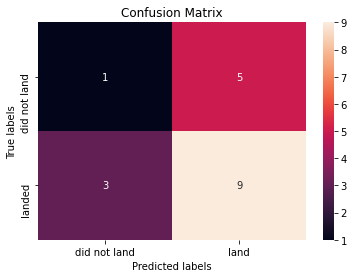

In [25]:
yhat = tree_cv.predict(X_test)
plot_confusion_matrix(Y_test,yhat)

In [26]:
print(classification_report(Y_test, yhat))

              precision    recall  f1-score   support

           0       0.25      0.17      0.20         6
           1       0.64      0.75      0.69        12

    accuracy                           0.56        18
   macro avg       0.45      0.46      0.45        18
weighted avg       0.51      0.56      0.53        18



## TASK  10


Create a k nearest neighbors object then  create a  <code>GridSearchCV</code> object  <code>knn_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [27]:
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}

KNN = KNeighborsClassifier()

In [28]:
knn_cv = GridSearchCV(KNN, parameters, cv=10)
knn_cv.fit(X_train, Y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'p': [1, 2]})

In [29]:
print("tuned hpyerparameters :(best parameters) ",knn_cv.best_params_)
print("accuracy :",knn_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'algorithm': 'auto', 'n_neighbors': 10, 'p': 1}
accuracy : 0.8482142857142858


## TASK  11


Calculate the accuracy of tree_cv on the test data using the method <code>score</code>:


In [30]:
knn_cv.score(X_test, Y_test)

0.8333333333333334

We can plot the confusion matrix


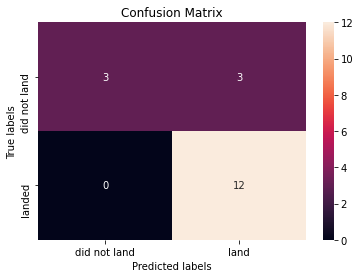

In [31]:
yhat = knn_cv.predict(X_test)
plot_confusion_matrix(Y_test,yhat)

## TASK  12


**bar chart to visualize the built mode accuracy**

In [32]:
models = {'lr': logreg_cv, 'svm': svm_cv, 'knn':knn_cv, 'tree': tree_cv}
models_dict = {'models': models.keys(), 'accuracy': [model.best_score_ for model in models.values()]}
models_df = pd.DataFrame.from_dict(models_dict, orient='index').T

In [33]:
models_df.head()

,models,accuracy
0,lr,0.846429
1,svm,0.848214
2,knn,0.848214
3,tree,0.885714


<AxesSubplot:xlabel='models', ylabel='accuracy'>

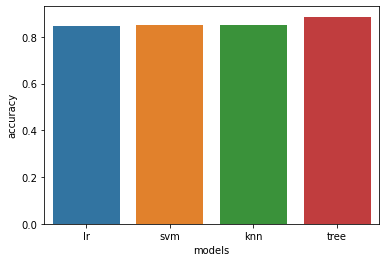

In [34]:
sns.barplot(x='models',
           y='accuracy',
           data= models_df)

Find the method performs best:


In [35]:
best_model = max(models, key= lambda x: models[x].best_score_)
print(f'best model: {models[best_model].best_params_},\naccuracy: {models[best_model].best_score_}')

best model: {'criterion': 'gini', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'splitter': 'random'},
accuracy: 0.8857142857142856


## Random Forest

In [39]:
rand_clf = RandomForestClassifier(random_state=6)
parameters = {'criterion': ['gini', 'entropy'],
              'n_estimators': [90, 100, 115, 130],
     'max_depth': [2*n for n in range(1,10)],
     'max_features': ['auto', 'sqrt', 'log2'],
     'min_samples_leaf': range(2, 10, 1),
     'min_samples_split': range(2, 10, 1)}

In [41]:
grid_search = GridSearchCV(estimator=rand_clf, param_grid=parameters, cv=5, n_jobs = -1, verbose = 3)
grid_search.fit(X_train, Y_train)

Fitting 5 folds for each of 13824 candidates, totalling 69120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    2.9s


[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1

[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    9.2s


[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.857, total=

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimato

[Parallel(n_jobs=-1)]: Done 284 tasks      | elapsed:   20.2s


[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.929, total=  

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=10

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.867, total=

[Parallel(n_jobs=-1)]: Done 508 tasks      | elapsed:   35.3s


[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimato

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.929, total=

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.800, total=   0

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=

[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:   55.2s


[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.800, total=

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=

[Parallel(n_jobs=-1)]: Done 1148 tasks      | elapsed:  1.3min


[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimato

[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.643, total=  

[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=1

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.867, total=  

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=10

[Parallel(n_jobs=-1)]: Done 1564 tasks      | elapsed:  1.8min


[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.929, total=   0

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=10

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.867, total=   0

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimator

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.867, total=

[Parallel(n_jobs=-1)]: Done 2044 tasks      | elapsed:  2.3min


[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=9

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.714, total=

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.867, total=  

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100

[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.643, total=   0

[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimato

[Parallel(n_jobs=-1)]: Done 2588 tasks      | elapsed:  3.0min


[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimator

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.867, total=

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.867, total=   0

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimato

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.714, total=   0

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=1

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.867, total=

[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed:  3.6min


[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimato

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.867, total=  

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=1

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.786, total=   0

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimato

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.714, total=   0

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.667, total=

[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimato

[Parallel(n_jobs=-1)]: Done 3868 tasks      | elapsed:  4.4min


[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=1

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.867, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.786, total=   0

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimato

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.786, total=   0

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimator

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.867, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators

[Parallel(n_jobs=-1)]: Done 4604 tasks      | elapsed:  5.2min


[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimator

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.714, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.786, total=

[Parallel(n_jobs=-1)]: Done 5404 tasks      | elapsed:  6.2min


[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.867, total=  

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=1

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.867, total=

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=100

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.867, total=

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.800, total=   0

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.714, total=

[Parallel(n_jobs=-1)]: Done 6268 tasks      | elapsed:  7.1min


[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0

[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=10

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.867, total=

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=9

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimator

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.800, total=

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.714, total=   0

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.714, total=

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimato

[Parallel(n_jobs=-1)]: Done 7196 tasks      | elapsed:  8.2min


[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0

[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.643, total=   0.2s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimator

[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.714, total=

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.800, total=

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.929, total=   0

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimator

[Parallel(n_jobs=-1)]: Done 8188 tasks      | elapsed:  9.3min


[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.867, total=

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.786, total=   0

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.800, total=  

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.800, total=

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimato

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=9

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.786, total=   0

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.800, total=

[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimato

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.867, total=   0

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=10

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=

[Parallel(n_jobs=-1)]: Done 9244 tasks      | elapsed: 10.5min


[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.867, total=   0

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=1

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.786, total=  

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.800, total=  

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.786, total=  

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimato

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.714, total=   0

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimato

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.867, total=  

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=1

[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.867, total=  

[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.800, total=  

[Parallel(n_jobs=-1)]: Done 10364 tasks      | elapsed: 11.8min


[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.867, total=   0

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimato

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.800, total=  

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.714, total=

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=  

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=1

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.786, total=  

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.733, total=  

[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=100

[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.643, total=

[Parallel(n_jobs=-1)]: Done 11548 tasks      | elapsed: 13.1min


[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimato

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.857, total=

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.786, total=   0

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.800, total=

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.929, total=

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.867, total=  

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=1

[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.867, total=

[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimato

[Parallel(n_jobs=-1)]: Done 12796 tasks      | elapsed: 14.6min


[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.714, total=   0

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimato

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.800, total=   0

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimato

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.867, total=

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.929, total=   0

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.786, total=

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimato

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.714, total=   0

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.800, total=  

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimato

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.786, total=

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimato

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.867, total=   0

[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.786, total=

[Parallel(n_jobs=-1)]: Done 14108 tasks      | elapsed: 16.1min


[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.800, total=   0

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=10

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.867, total=

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.929, total=   0

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=130, score=0.800, total=

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimator

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.867, total=

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimato

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.786, total=   0

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.733, total=

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimato

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.733, total=   0

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimator

[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.643, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.667, total=

[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.800, tota

[Parallel(n_jobs=-1)]: Done 15484 tasks      | elapsed: 17.6min


[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.800, 

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.867, 

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.800, to

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.929, to

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.929

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.867

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.929, 

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.867, tota

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.800, 

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.786

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, to

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.714, 

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, to

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.800, to

[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.800

[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.857

[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.857, to

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estim

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_e

[Parallel(n_jobs=-1)]: Done 16924 tasks      | elapsed: 19.3min


[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_esti

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_esti

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_e

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_es

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_esti

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estima

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_est

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_es

[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_est

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estima

[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_e

[Parallel(n_jobs=-1)]: Done 18428 tasks      | elapsed: 21.0min


[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.867, to

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.800, 

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.800

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.867, 

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.786, tota

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, to

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.733, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.733

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.733, 

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.714, tota

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.714, to

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.714

[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.857, to

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, tota

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, to

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.929

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.929

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.929, to

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.800, tota

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, 

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.857, to

[Parallel(n_jobs=-1)]: Done 19996 tasks      | elapsed: 22.7min


[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.867, to

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.800, 

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.714

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.786

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.786, 

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.714, to

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714

[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.786, to

[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.786, 

[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.867

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_es

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estima

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_est

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_es

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estima

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_esti

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_e

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_es

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_esti

[Parallel(n_jobs=-1)]: Done 21628 tasks      | elapsed: 24.6min


[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_e

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_esti

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_e

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_esti

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_est

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_esti

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_esti

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_est

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_e

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_esti

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_est

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_

[Parallel(n_jobs=-1)]: Done 23324 tasks      | elapsed: 26.5min


[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.800, 

[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.857

[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.857

[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.786, tota

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_es

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_esti

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_est

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_e

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_esti

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estim

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_e

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_esti

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_e

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_esti

[Parallel(n_jobs=-1)]: Done 25084 tasks      | elapsed: 28.5min


[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estim

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_e

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_es

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_esti

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_est

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_esti

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estima

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_est

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_es

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_esti

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_esti

[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.867, 

[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.786

[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.800, 

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_est

[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.800

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.733, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_es

[Parallel(n_jobs=-1)]: Done 26908 tasks      | elapsed: 30.6min


[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_esti

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estim

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_e

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_es

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estim

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_e

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_esti

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_esti

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_est

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_esti

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_est

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_e

[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_es

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_esti

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estim

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_e

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_es

[Parallel(n_jobs=-1)]: Done 28796 tasks      | elapsed: 32.8min


[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, to

[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.929

[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786

[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, to

[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, 

[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.714

[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.714

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_esti

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_esti

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_e

[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_es

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estima

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estim

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_est

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_est

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_e

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_esti

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_e

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_es

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_esti

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.643, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.643, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_

[Parallel(n_jobs=-1)]: Done 30748 tasks      | elapsed: 35.0min


[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.667, 

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.857

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.857, to

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.867, tota

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.857

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.929

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.929, to

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.929, to

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.867

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.867

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.800, 

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.867, tota

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.867

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.867

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, 

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.714, tota

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.786, to

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.867, 

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714

[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.643, 

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.867, tota

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.800, 

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.857

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.929

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.929, to

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.867, to

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.857

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.786

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.929, to

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.867, to

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.800, 

[Parallel(n_jobs=-1)]: Done 32764 tasks      | elapsed: 37.3min


[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.786

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.714

[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, to

[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estim

[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_e

[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_

[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_es

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estima

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estim

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_e

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_est

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_esti

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_est

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_e

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.733, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_es

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estima

[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=gini, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estim

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samp

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=

[Parallel(n_jobs=-1)]: Done 34844 tasks      | elapsed: 39.6min


[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90,

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=11

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=4, min_sam

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=5, min_samples

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samp

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=9

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_s

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100,

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_sample

[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=9, min_sam

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=9

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=100,

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samp

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=5, min_sam

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=100, s

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_sample

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=

[Parallel(n_jobs=-1)]: Done 36988 tasks      | elapsed: 42.1min


[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=8, min_sam

[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=9, min_sam

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=9

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, s

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100,

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_sample

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_sam

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_sampl

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=90,

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=100,

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=7, min_samp

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=8, min_sam

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_sam

[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=90,

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=100,

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samp

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_sampl

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100,

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=11

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=

[Parallel(n_jobs=-1)]: Done 39196 tasks      | elapsed: 44.6min


[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=9

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=11

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=8, min_sampl

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=100,

[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samp

[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90, s

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_sam

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.786, total=   0.3s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90, s

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=11

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90,

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=7, min_samples_s

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100,

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=8, min_sam

[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_sam

[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=9, min_sampl

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_s

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100,

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samp

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_sam

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_sampl

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=7, n_estimators=90,

[Parallel(n_jobs=-1)]: Done 41468 tasks      | elapsed: 47.2min


[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_sampl

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, s

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=10

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samp

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_sam

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, s

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=8, min_samples

[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100,

[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=9, min_samp

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90,

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100,

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_sample

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_sam

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_sampl

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=90, s

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=10

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=9

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=8, min_sampl

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=90,

[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_s

[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=100,

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samp

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samp

[Parallel(n_jobs=-1)]: Done 43804 tasks      | elapsed: 49.8min


[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_sam

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90,

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_sampl

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=10

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=9

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100,

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=8, min_sam

[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_sam

[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100,

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_sample

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100,

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_sam

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_sampl

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, s

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=6, min_sample

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100,

[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_sample

[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_sam

[Parallel(n_jobs=-1)]: Done 46204 tasks      | elapsed: 52.6min


[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=9

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=100,

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samp

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_sampl

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=90,

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_sample

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_sam

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=2, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=90,

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=100,

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_sample

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=8, min_sam

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=3, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_sam

[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90,

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=10

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_sam

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_sam

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=9

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_sampl

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=90,

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=10

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samp

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=5, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=7, min_sam

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=9

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=8, min_samples

[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=100,

[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samp

[Parallel(n_jobs=-1)]: Done 48668 tasks      | elapsed: 55.4min


[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_sam

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_sampl

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=90, s

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=10

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_sam

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_sam

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=9

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=6, min_samples

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, s

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=7, min_sample

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=11

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_sam

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_sam

[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90,

[CV]  criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_sa

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimat

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.786, total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, 

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_est

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_est

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estima

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimator

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=6, mi

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estim

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_esti

[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min

[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimat

[Parallel(n_jobs=-1)]: Done 51196 tasks      | elapsed: 58.3min


[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=9, mi

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estim

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, 

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3,

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_esti

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, m

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estima

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimat

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, mi

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_est

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6,

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estima

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimat

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, mi

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estim

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9,

[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estima

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimat

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, mi

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_est

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5,

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimat

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, mi

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_esti

[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min

[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimat

[Parallel(n_jobs=-1)]: Done 53788 tasks      | elapsed: 61.2min


[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=9,

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, m

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimat

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3,

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, m

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estima

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estim

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, m

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estima

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_esti

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min

[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimat

[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=9,

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estima

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_s

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimat

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, 

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_esti

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_s

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estim

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6,

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=7, min_samples_split=8, n_estima

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=6, n_estim

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_esti

[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=9, m

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimato

[Parallel(n_jobs=-1)]: Done 56444 tasks      | elapsed: 64.2min


[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimat

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, 

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_est

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estima

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estim

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6,

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_esti

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=8, m

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimat

[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=6, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, mi

[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=9, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, n_est

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3,

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimat

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estim

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, mi

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estim

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6,

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7,

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_esti

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimator

[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_

[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimat

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, 

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_esti

[Parallel(n_jobs=-1)]: Done 59164 tasks      | elapsed: 67.4min


[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimato

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimat

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, 

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_est

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=6, m

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimato

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estim

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_est

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9,

[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=6, n_esti

[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min_samples_split=9, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=9, min

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimato

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, n_estimat

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, 

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, n_estima

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=3, n_estimat

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, 

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=6, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_est

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, m

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimator

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=8, min_

[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estim

[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=9, 

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_est

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=2,

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3,

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=7, n_esti

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=3, min_samples_split=9, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimator

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=4, mi

[Parallel(n_jobs=-1)]: Done 61948 tasks      | elapsed: 70.5min


[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=5, min_samples_split=9, n_est

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, m

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=6, min_samples_split=8, n_estima

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=6, n_estimat

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=7, min_

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=4, n_estim

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=2, n_est

[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=5, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9,

[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=auto, min_samples_leaf=9, min_samples_split=9, n_esti

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_s

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, n_estimat

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, 

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=3,

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estima

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, n_estimato

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_s

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=6, n_estimat

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=6, 

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=4, n_est

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=2, n_est

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_esti

[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min

[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estim

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_esti

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=6, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=3, min_s

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, mi

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estim

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estima

[Parallel(n_jobs=-1)]: Done 64796 tasks      | elapsed: 73.8min


[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=6, min_samples_split=7, n_estimat

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, 

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7, min_samples_split=8, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=4, n_esti

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=6, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=7, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=8, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=2, n_estimato

[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=5, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_

[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=16, max_features=log2, min_samples_leaf=9, min_samples_split=8, n_estim

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=2, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=2, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=4, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=5, n_estimat

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=3, mi

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=4, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=2, n_esti

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_s

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=5, min_samples_split=8, n_estimat

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, mi

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=6, min_samples_split=9, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=5, n_estima

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=7, min

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, mi

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=6, n_estim

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8, min_samples_split=9, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.643, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=4, n_est

[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=auto, min_samples_leaf=9,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_est

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, n_estima

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, n_estim

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, n_est

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimat

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, mi

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=6, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=6, n_est

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=115, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=7, min_samples_split=9, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=4, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=5, n_esti

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=7, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min

[Parallel(n_jobs=-1)]: Done 67708 tasks      | elapsed: 77.1min


[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=8, min_samples_split=9, n_estimato

[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=4, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min

[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=sqrt, min_samples_leaf=9, min_samples_split=7, n_est

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=115, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2,

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130, score=0.857, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=8, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min_samples_split=9, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=2, min

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=3, n_estimators=130, score=0.786, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=4, n_estimato

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, min_samples_split=7, n_estimators=100, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=3, mi

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_est

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.929, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4,

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130, score=0.929, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=4, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.800, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.857, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=4, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, m

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=90, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=5, min_samples_split=7, n_estimator

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, 

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=5, n_est

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.867, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6, min_samples_split=8, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=6,

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=115, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=3, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=4, n_esti

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.867, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=6, n_estimators=130, score=0.714, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min_samples_split=7, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=7, min

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=90, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=2, n_estimat

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.733, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.643, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=100, score=0.786, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=115, score=0.800, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8,

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130, score=0.733, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=8, min_samples_split=8, n_est

[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=3, n_estimators=130, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=4, n_estimators=90, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, m

[Parallel(n_jobs=-1)]: Done 69120 out of 69120 | elapsed: 78.7min finished


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=6), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10),
                         'n_estimators': [90, 100, 115, 130]},
             verbose=3)

In [42]:
print("tuned hpyerparameters :(best parameters) ",grid_search.best_params_)
print("accuracy :",grid_search.best_score_)

tuned hpyerparameters :(best parameters)  {'criterion': 'gini', 'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 90}
accuracy : 0.8476190476190476


In [43]:
grid_search.score(X_test, Y_test)

0.8333333333333334

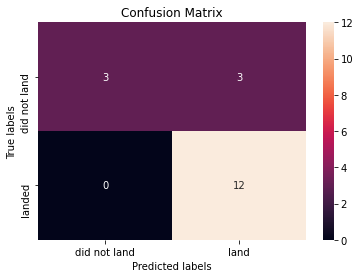

[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.667, total=   0.1s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=115, score=0.714, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130, score=0.667, total=   0.2s
[CV] criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_estimators=130 
[CV]  criterion=entropy, max_depth=18, max_features=log2, min_samples_leaf=9, min_samples_split=7, n_est

In [44]:
yhat = grid_search.predict(X_test)
plot_confusion_matrix(Y_test,yhat)

## Authors


<a href="https://www.linkedin.com/in/joseph-s-50398b136/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDS0321ENSkillsNetwork26802033-2021-01-01">Joseph Santarcangelo</a> has a PhD in Electrical Engineering, his research focused on using machine learning, signal processing, and computer vision to determine how videos impact human cognition. Joseph has been working for IBM since he completed his PhD.


## Change Log


| Date (YYYY-MM-DD) | Version | Changed By    | Change Description      |
| ----------------- | ------- | ------------- | ----------------------- |
| 2021-08-31        | 1.1     | Lakshmi Holla | Modified markdown       |
| 2020-09-20        | 1.0     | Joseph        | Modified Multiple Areas |


Copyright © 2020 IBM Corporation. All rights reserved.
